# DM-24252: ap_pipe run on all five filters of HSC COSMOS 8913

## This is the first medium-scale ap_pipe rerun on HSC data in multiple filters
Total 41921 dataIds (visit + ccd combinations), which had 16584 failures (40%).
* 11294 (68%) of the failures are the sqlite3 APDB database being locked in diaPipe
* 4211 (25%) of the failures result from not being able to find a coadd template in imageDifference

In the latter case, the failure is specifically not being able to find a coadd PhotoCalib.

I ran this on slurm using weekly `w_2020_26` on 3-4 July 2020. It ran overnight.

Each filter was processed in a different rerun on lsst-dev in `/project/mrawls/cosmos`, and the rerun sizes on disk are each 500 GB - 2 TB. The APDB for each filter is 2 - 10 GB. The reruns containing the template coadds in different per-filter reruns, and each is about 100 GB.

### Lots of garbage background noise sources
An overwhelming number of the DIA Sources are false background detections which associate into DIA Objects containing only 1--2 sources. This can likely be mitigated in future reruns by scaling the variance for both the template and the difference image before running source detection in the difference image.

### Database locked errors
The APDB locked database errors appear to occur more frequently in visits with later timestamps. It's possible this problem will be mitigated somewhat when there are significantly fewer garbage sources to sift through.

### Visits that are a small portion of the full focal plane
Some of the visits do not appear to include anywhere near the full focal plane - this could be related to the template lookup error and perhaps bad astrometry? This is particularly pronounced in G-band, where there are minimal database errors but nearly every other visit is a tiny region of sky compared to the usual 103 CCD pattern.

### Convenient overlap with HiTS field
Through a remarkable coincidence, one of the DECam g-band HiTS fields I have been reprocessing overlaps this tract. This is a very handy way to get a ballpark for how many DIA Sources we "should" be seeing.

Disclaimer: I made a lot of plots here, and not all of them are amazing and/or particularly useful.

### Errors from the logs

*G: 535 failures of 3605 dataIds*
* 359 failures happen before the DiaPipeline stage
    * 344 of these are no coadd PhotoCalib
    * 15 remain and have not been traced
* 147 are sqlite3 operational errors (database is locked)
* 29 are index errors that happen as soon as diaPipe begins

*R2: 433 failures of 2884 dataIds*
* 338 failures happen before the DiaPipeline stage
    * 322 of these are no coadd PhotoCalib
    * 16 remain and have not been traced
* 24 are sqlite3 operational errors (database is locked)
* 71 are index errors that happen as soon as diaPipe begins

*I2: 4690 failures of 10609 dataIds*
* 1163 failures happen before the DiaPipeline stage
    * 1051 of these are no coadd PhotoCalib
    * 112 remain and have not been traced
* 3185 are sqlite3 operational errors (database is locked)
* 342 are index errors that happen as soon as diaPipe begins

*Z: 5418 failiures of 12154 dataIds*
* 1423 failures happen before the DiaPipeline stage
    * 1216 of these are no coadd PhotoCalib
    * 207 remain and have not been traced
* 3861 are sqlite3 operational errors (database is locked)
* 134 remain and have not been traced ... supposedly there are 236 index errors?!

*Y: 5508 failures of 12669 dataIds*
* 1372 failures happen before the DiaPipeline stage
    * 1278 of these are no coadd PhotoCalibs
    * 94 remain and have not been traced
* 4077 are sqlite3 operational errors (database is locked)
* 58 are index errors that happen as soon as diaPipe begins
* 1 remains and has not been traced


In [172]:
%matplotlib notebook

import sys
import numpy as np
import matplotlib.pyplot as plt
import importlib
import pandas as pd

import lsst.daf.persistence as dafPersist

plt.rcParams.update({'figure.max_open_warning': 0})

In [2]:
sys.path.append('/project/mrawls/ap_pipe-notebooks/')
import diaObjectAnalysis as doa
import apdbPlots as pla

In [109]:
# Only if you change anything in the code imported above
importlib.reload(doa)
importlib.reload(pla)

<module 'apdbPlots' from '/project/mrawls/ap_pipe-notebooks/apdbPlots.py'>

In [3]:
repoG = '/project/mrawls/cosmos/rerun/ap_pipe-g-202007'
repoR2 = '/project/mrawls/cosmos/rerun/ap_pipe-r2-202007'
repoI2 = '/project/mrawls/cosmos/rerun/ap_pipe-i2-202007'
repoZ = '/project/mrawls/cosmos/rerun/ap_pipe-z-202007'
repoY = '/project/mrawls/cosmos/rerun/ap_pipe-y-202007'

In [4]:
objTableG, srcTableG, goodObjG, goodSrcG = pla.loadTables(repoG)
objTableR2, srcTableR2, goodObjR2, goodSrcR2 = pla.loadTables(repoR2)
objTableI2, srcTableI2, goodObjI2, goodSrcI2 = pla.loadTables(repoI2)
objTableZ, srcTableZ, goodObjZ, goodSrcZ = pla.loadTables(repoZ)
objTableY, srcTableY, goodObjY, goodSrcY = pla.loadTables(repoY)

In [35]:
repoHits = '/project/mrawls/hits2015/rerun/cw_2020_06'
objTableHits, srcTableHits, goodObjHits, goodSrcHits = pla.loadTables(repoHits)

/opt/lsst/software/stack/conda/miniconda3-py37_4.8.2/envs/lsst-scipipe-1a1d771/lib/python3.7/site-packages/ipykernel/__main__.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


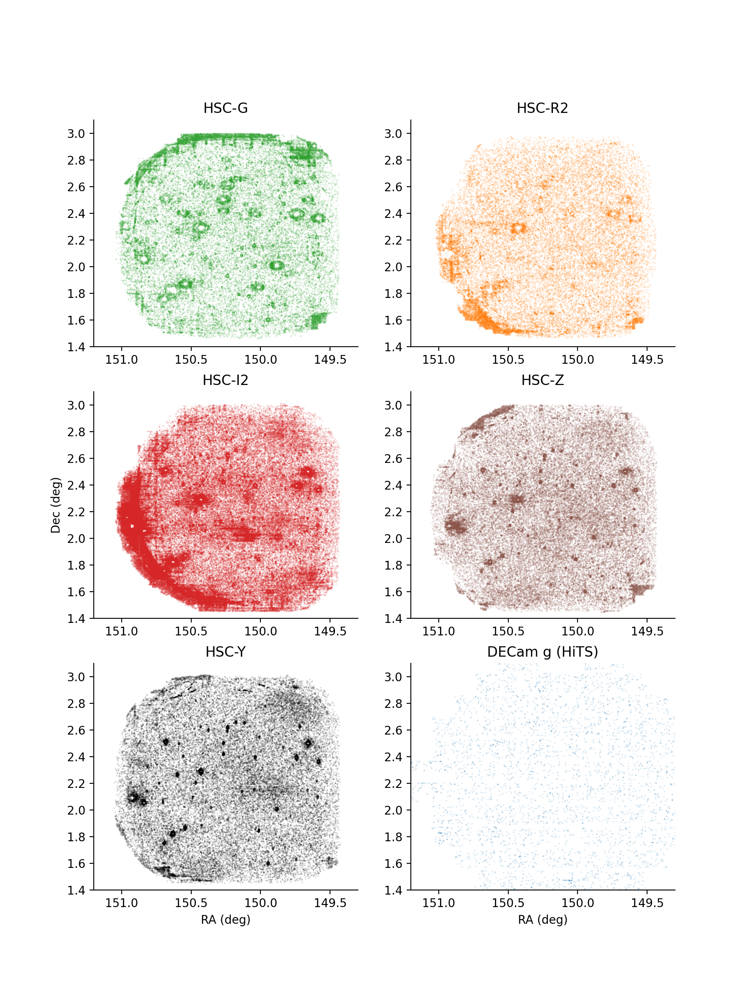

In [170]:
fig, axs = plt.subplots(3, 2, figsize=(9, 12))

axG = axs[0, 0]
axR2 = axs[0, 1]
axI2 = axs[1, 0]
axZ = axs[1, 1]
axY = axs[2, 0]
axHits = axs[2, 1]
#axHits.axis('off')

xlim = (151.2, 149.3)
ylim = (1.4, 3.1)
plt.setp(axs, xlim=xlim, ylim=ylim)
nSrc = 2  # threshold for which DIA Objects to plot (only those with > nSrc constituent DIA Sources)

axG.scatter(goodObjG.loc[goodObjG['nDiaSources'] > nSrc, 'ra'],
            goodObjG.loc[goodObjG['nDiaSources'] > nSrc, 'decl'], c='C2', s=0.1, marker='.', alpha=0.4)
axR2.scatter(goodObjR2.loc[goodObjR2['nDiaSources'] > nSrc, 'ra'],
             goodObjR2.loc[goodObjR2['nDiaSources'] > nSrc, 'decl'], c='C1', s=0.1, marker='.', alpha=0.4)
axI2.scatter(goodObjI2.loc[goodObjI2['nDiaSources'] > nSrc, 'ra'],
             goodObjI2.loc[goodObjI2['nDiaSources'] > nSrc, 'decl'], c='C3', s=0.1, marker='.', alpha=0.4)
axZ.scatter(goodObjZ.loc[goodObjZ['nDiaSources'] > nSrc, 'ra'],
            goodObjZ.loc[goodObjZ['nDiaSources'] > nSrc, 'decl'], c='C5', s=0.1, marker='.', alpha=0.4)
axY.scatter(goodObjY.loc[goodObjY['nDiaSources'] > nSrc, 'ra'],
            goodObjY.loc[goodObjY['nDiaSources'] > nSrc, 'decl'], c='k', s=0.1, marker='.', alpha=0.4)

axHits.scatter(goodObjHits.loc[goodObjHits['nDiaSources'] > nSrc, 'ra'],
               goodObjHits.loc[goodObjHits['nDiaSources'] > nSrc, 'decl'], c='C0', s=0.1, marker='.', alpha=0.4)

axY.set_xlabel('RA (deg)')
axHits.set_xlabel('RA (deg)')
axI2.set_ylabel('Dec (deg)')

axG.set_title('HSC-G')
axR2.set_title('HSC-R2')
axI2.set_title('HSC-I2')
axZ.set_title('HSC-Z')
axY.set_title('HSC-Y')
axHits.set_title('DECam g (HiTS)')

axG.spines['top'].set_visible(False)
axG.spines['right'].set_visible(False)
axR2.spines['top'].set_visible(False)
axR2.spines['right'].set_visible(False)
axI2.spines['top'].set_visible(False)
axI2.spines['right'].set_visible(False)
axZ.spines['top'].set_visible(False)
axZ.spines['right'].set_visible(False)
axY.spines['top'].set_visible(False)
axY.spines['right'].set_visible(False)
axHits.spines['top'].set_visible(False)
axHits.spines['right'].set_visible(False)


### Let's do that again, but zoomed in

/opt/lsst/software/stack/conda/miniconda3-py37_4.8.2/envs/lsst-scipipe-1a1d771/lib/python3.7/site-packages/ipykernel/__main__.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


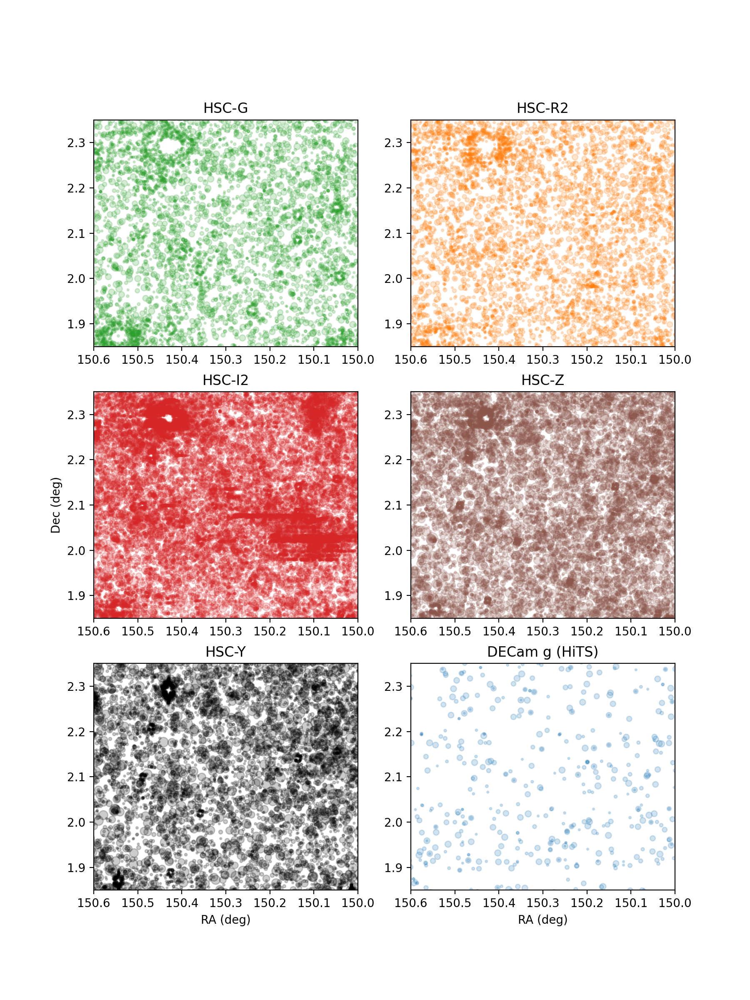

In [171]:
fig, axs = plt.subplots(3, 2, figsize=(9, 12))

axG = axs[0, 0]
axR2 = axs[0, 1]
axI2 = axs[1, 0]
axZ = axs[1, 1]
axY = axs[2, 0]
axHits = axs[2, 1]
#axLabel.axis('off')

xlim = [150.6, 150.0]
ylim = [1.85, 2.35]
plt.setp(axs, xlim=xlim, ylim=ylim)

axY.set_xlabel('RA (deg)')
axHits.set_xlabel('RA (deg)')
axI2.set_ylabel('Dec (deg)')

axG.set_title('HSC-G')
axR2.set_title('HSC-R2')
axI2.set_title('HSC-I2')
axZ.set_title('HSC-Z')
axY.set_title('HSC-Y')
axHits.set_title('DECam g (HiTS)')

axG.scatter(goodObjG.loc[goodObjG['nDiaSources'] > nSrc, 'ra'],
            goodObjG.loc[goodObjG['nDiaSources'] > nSrc, 'decl'],
            s=goodObjG.loc[goodObjG['nDiaSources'] > nSrc, 'nDiaSources'], c='C2', marker='o', alpha=0.2)

axR2.scatter(goodObjR2.loc[goodObjR2['nDiaSources'] > nSrc, 'ra'],
            goodObjR2.loc[goodObjR2['nDiaSources'] > nSrc, 'decl'],
            s=goodObjR2.loc[goodObjR2['nDiaSources'] > nSrc, 'nDiaSources'], c='C1', marker='o', alpha=0.2)

axI2.scatter(goodObjI2.loc[goodObjI2['nDiaSources'] > nSrc, 'ra'],
            goodObjI2.loc[goodObjI2['nDiaSources'] > nSrc, 'decl'],
            s=goodObjI2.loc[goodObjI2['nDiaSources'] > nSrc, 'nDiaSources'], c='C3', marker='o', alpha=0.2)

axZ.scatter(goodObjZ.loc[goodObjZ['nDiaSources'] > nSrc, 'ra'],
            goodObjZ.loc[goodObjZ['nDiaSources'] > nSrc, 'decl'],
            s=goodObjZ.loc[goodObjZ['nDiaSources'] > nSrc, 'nDiaSources'], c='C5', marker='o', alpha=0.2)

axY.scatter(goodObjY.loc[goodObjY['nDiaSources'] > nSrc, 'ra'],
            goodObjY.loc[goodObjY['nDiaSources'] > nSrc, 'decl'],
            s=goodObjY.loc[goodObjY['nDiaSources'] > nSrc, 'nDiaSources'], c='k', marker='o', alpha=0.2)

axHits.scatter(goodObjHits.loc[goodObjHits['nDiaSources'] > nSrc, 'ra'],
               goodObjHits.loc[goodObjHits['nDiaSources'] > nSrc, 'decl'],
               s=goodObjHits.loc[goodObjHits['nDiaSources'] > nSrc, 'nDiaSources'], c='C0', marker='o', alpha=0.2)

### Plot sources per visit as well as number of nightly visits
Note that the drops in the number of sources over time are due to the database error occurring more frequently.

<IPython.core.display.Javascript object>


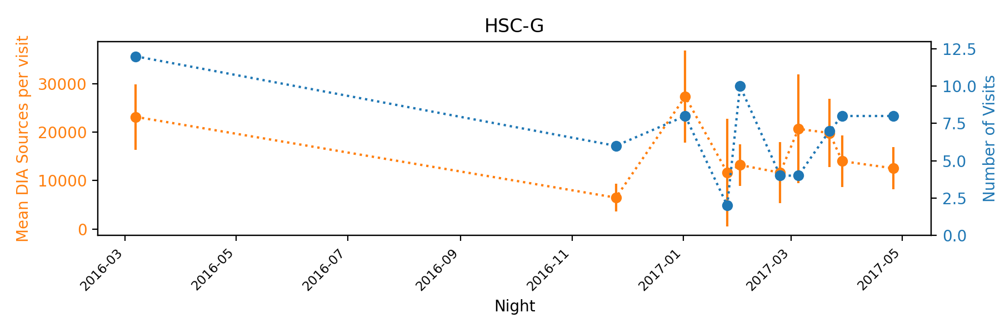

In [53]:
pla.plotDiaSourcesPerNight(goodSrcG, title='HSC-G')

<IPython.core.display.Javascript object>


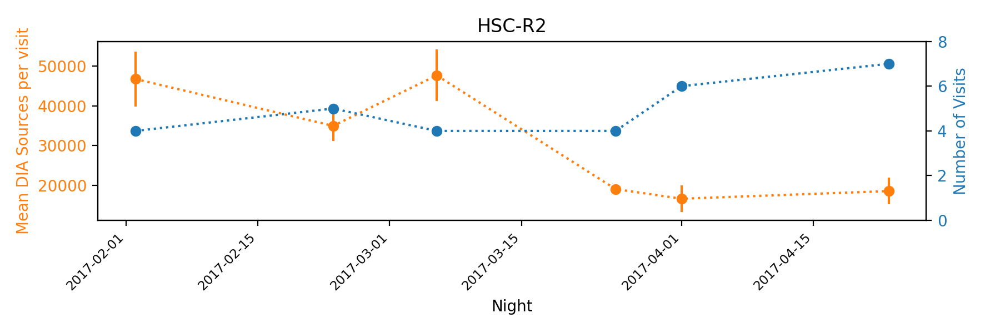

In [55]:
pla.plotDiaSourcesPerNight(goodSrcR2, title='HSC-R2')

<IPython.core.display.Javascript object>


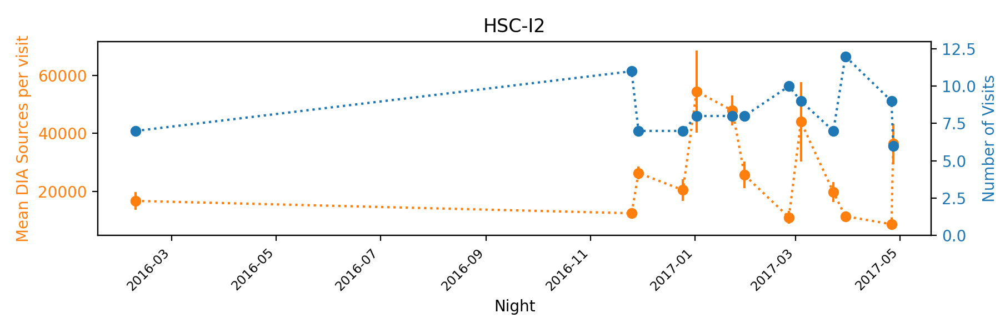

In [56]:
pla.plotDiaSourcesPerNight(goodSrcI2, title='HSC-I2')

<IPython.core.display.Javascript object>


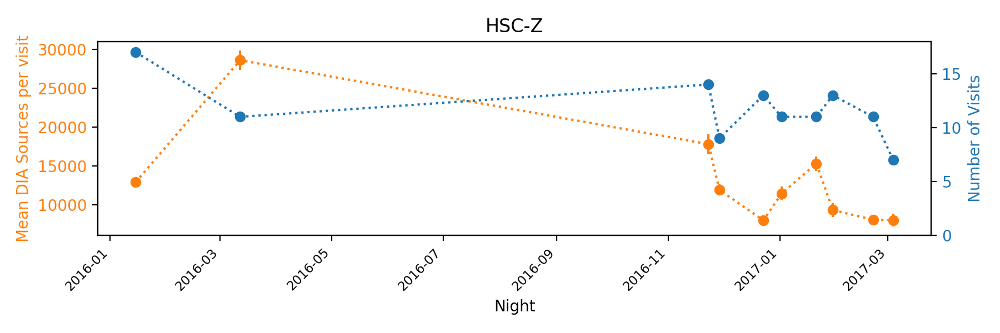

In [57]:
pla.plotDiaSourcesPerNight(goodSrcZ, title='HSC-Z')

<IPython.core.display.Javascript object>


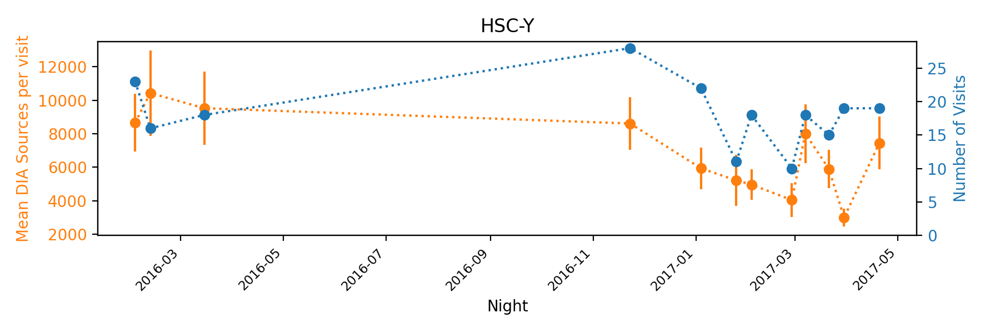

In [58]:
pla.plotDiaSourcesPerNight(goodSrcY, title='HSC-Y')

### Show DIA Sources broken out by visit
This is a nice at-a-glance way to see how much data was processed and if any visits look weird.

Spoiler: lots of visits look weird.

<IPython.core.display.Javascript object>


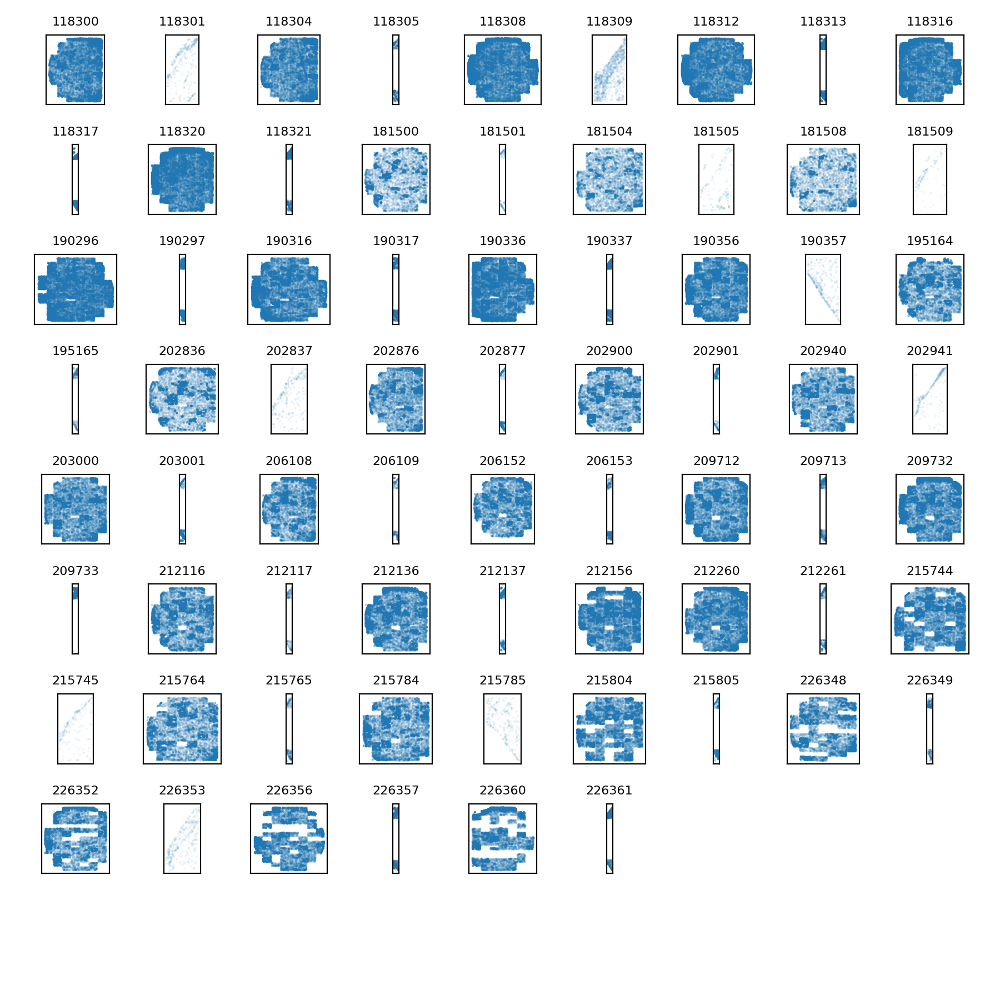

In [59]:
pla.plotDiaSourcesOnSkyGrid(repoG, goodSrcG)

<IPython.core.display.Javascript object>


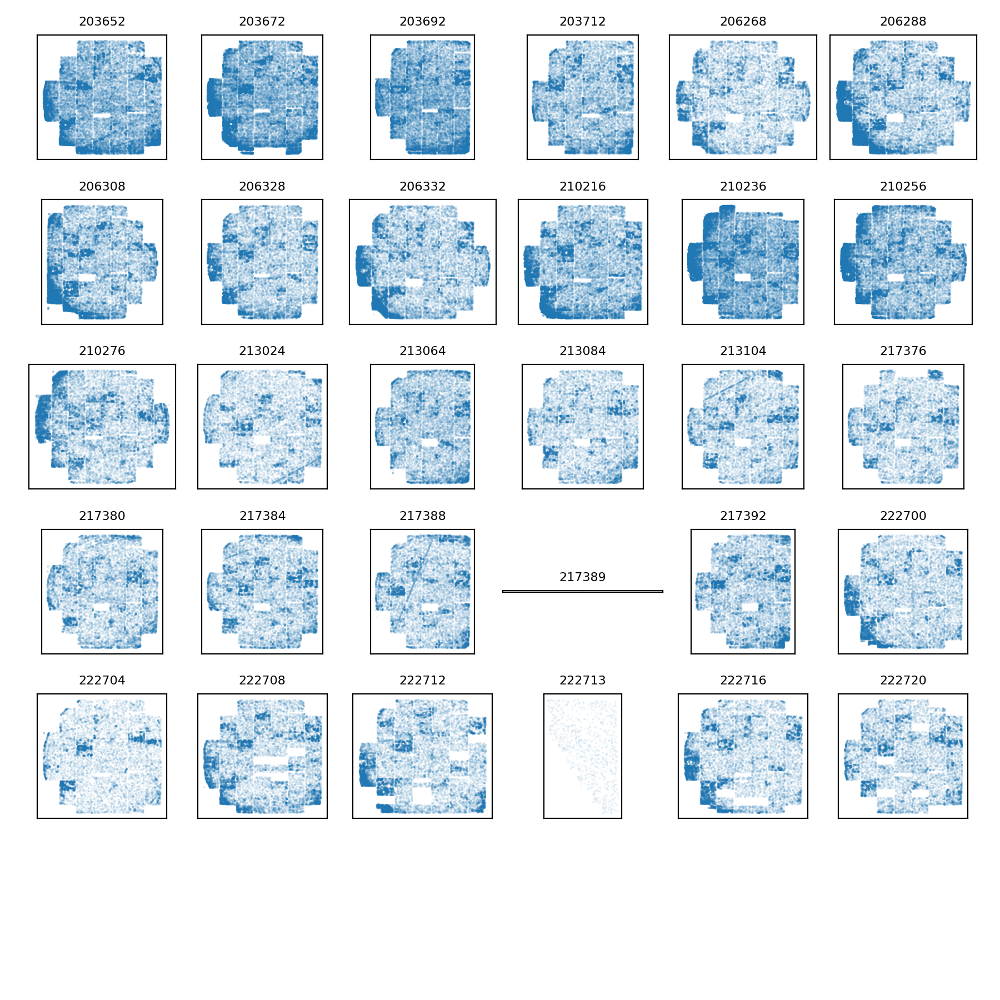

In [60]:
pla.plotDiaSourcesOnSkyGrid(repoR2, goodSrcR2)

<IPython.core.display.Javascript object>


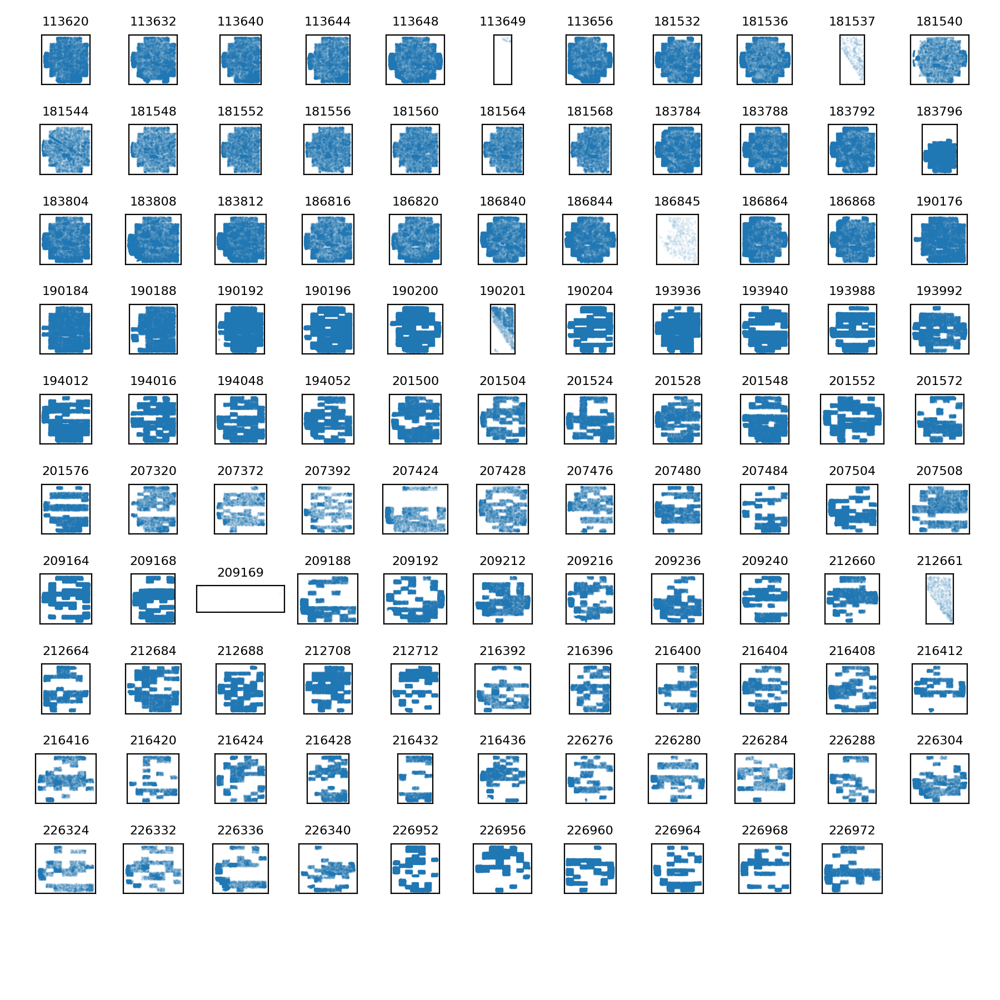

In [61]:
pla.plotDiaSourcesOnSkyGrid(repoI2, goodSrcI2)

<IPython.core.display.Javascript object>


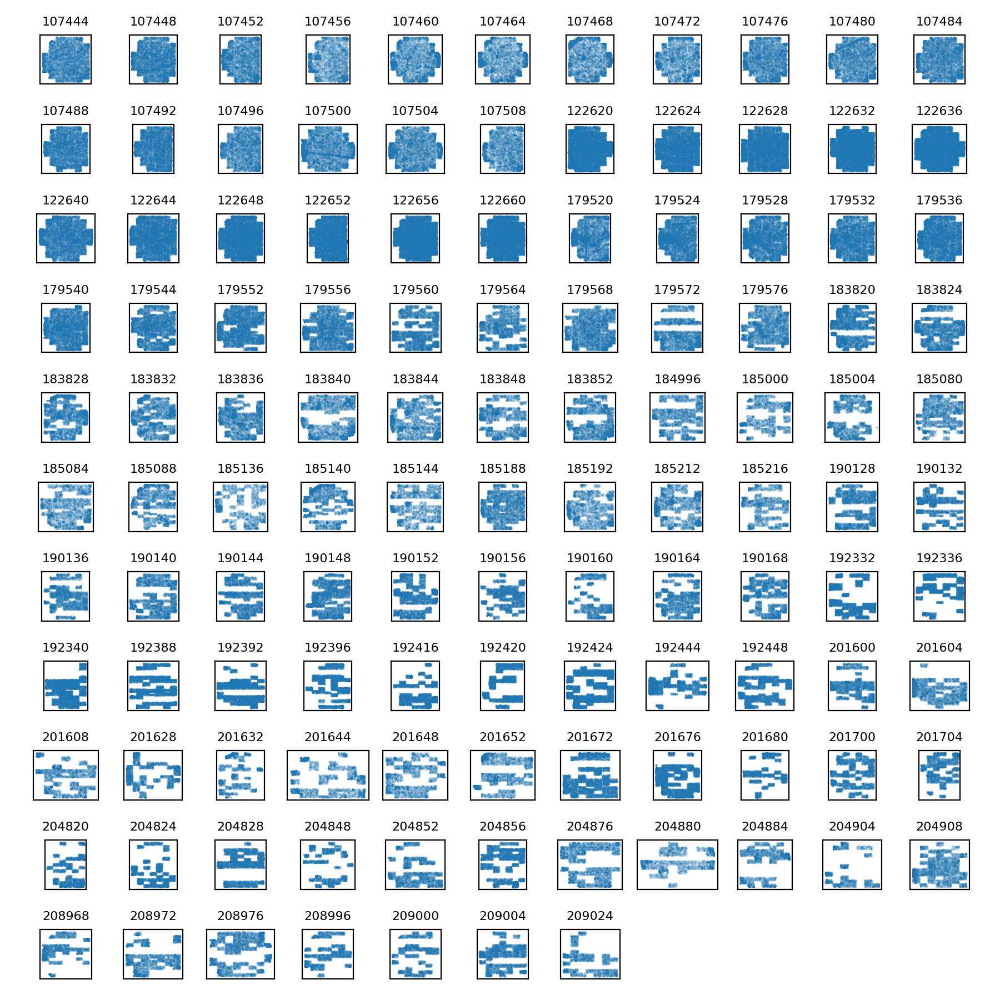

In [62]:
pla.plotDiaSourcesOnSkyGrid(repoZ, goodSrcZ)

<IPython.core.display.Javascript object>


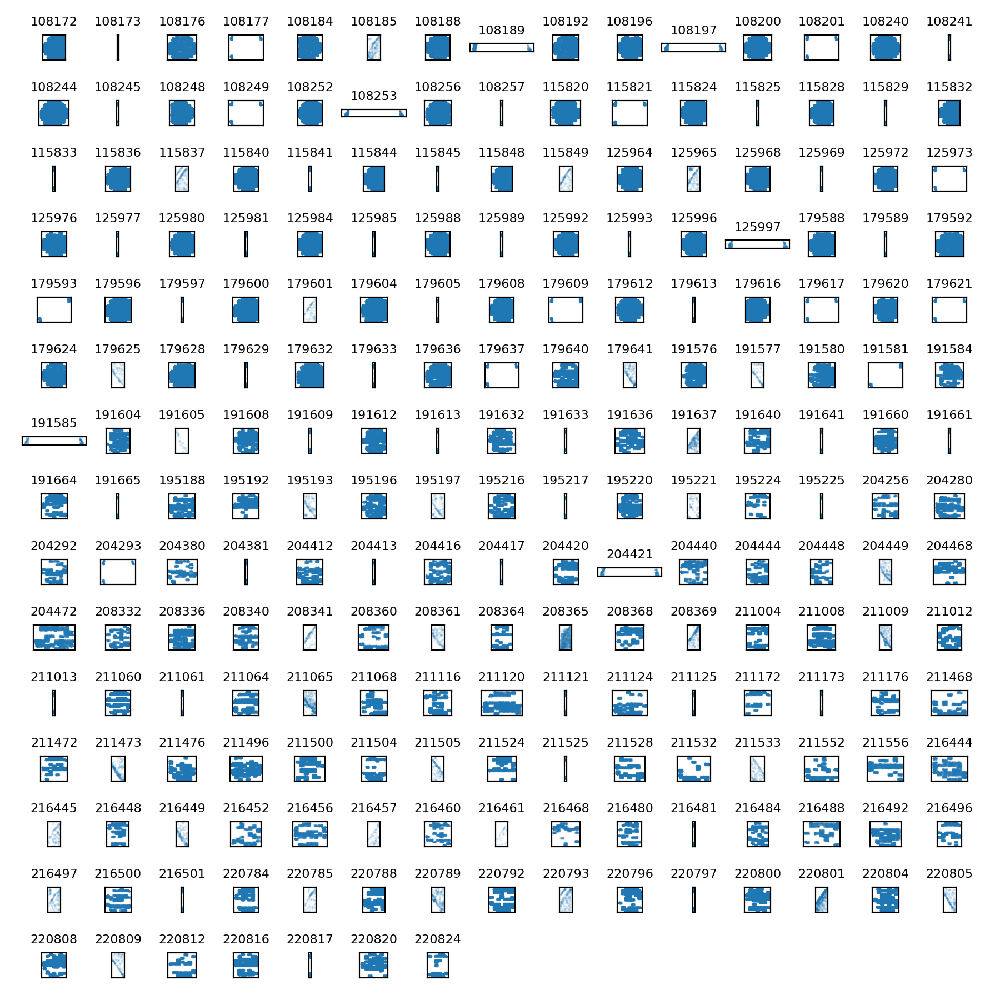

In [63]:
pla.plotDiaSourcesOnSkyGrid(repoY, goodSrcY)

### Histogram showing how many constituent sources each DIA Object has
Filtered objects refers only to objects comprised solely of so-called "good" sources. That means that none of the constituent sources have any of bad, suspect, or saturatedCenter pixel flags.

The all vs. filtered distributions are so similar because most of the sources are garbage background detections which don't have any particular flag set.

<IPython.core.display.Javascript object>


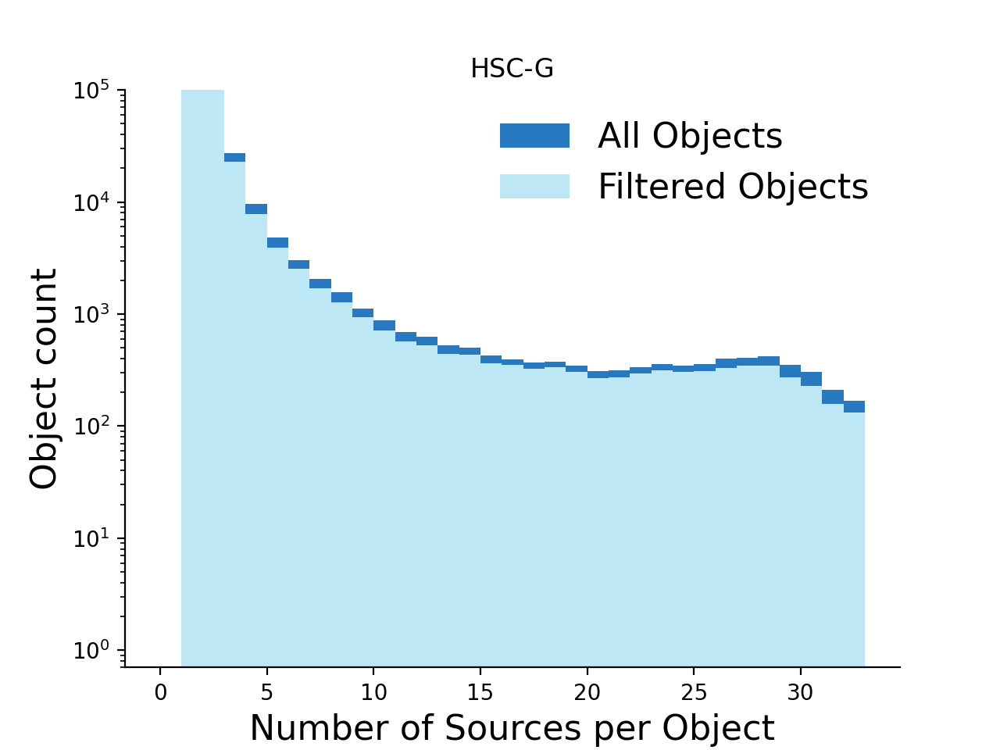

In [68]:
histG = doa.plotDiaObjectHistogram(objTableG, goodObjG, title='HSC-G')

<IPython.core.display.Javascript object>


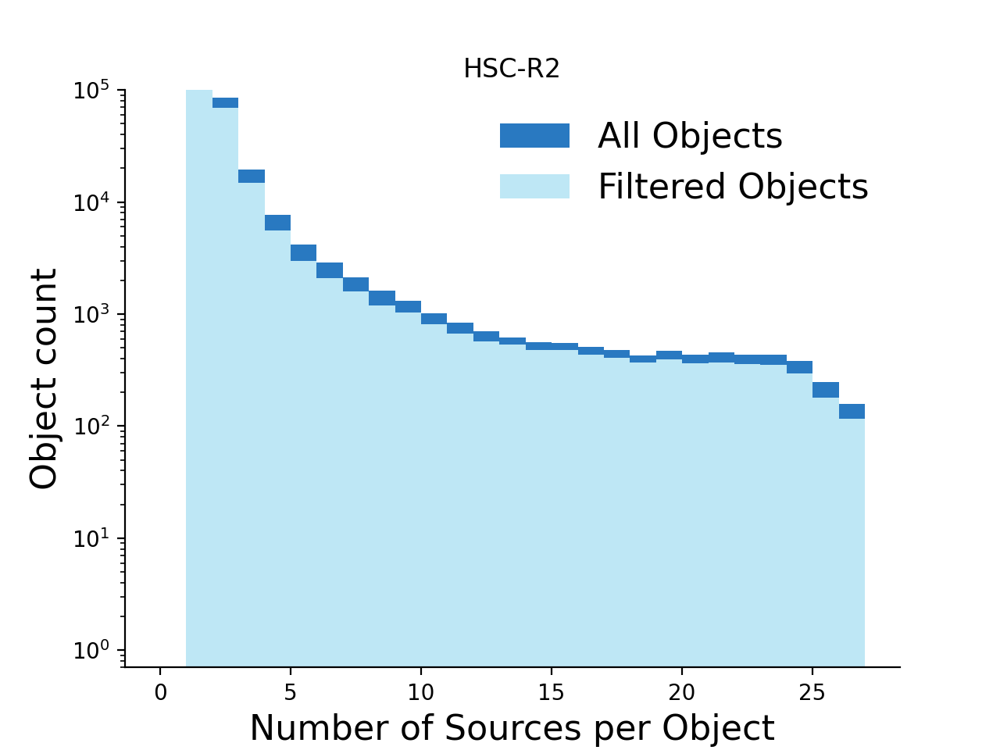

In [69]:
histR2 = doa.plotDiaObjectHistogram(objTableR2, goodObjR2, title='HSC-R2')

<IPython.core.display.Javascript object>


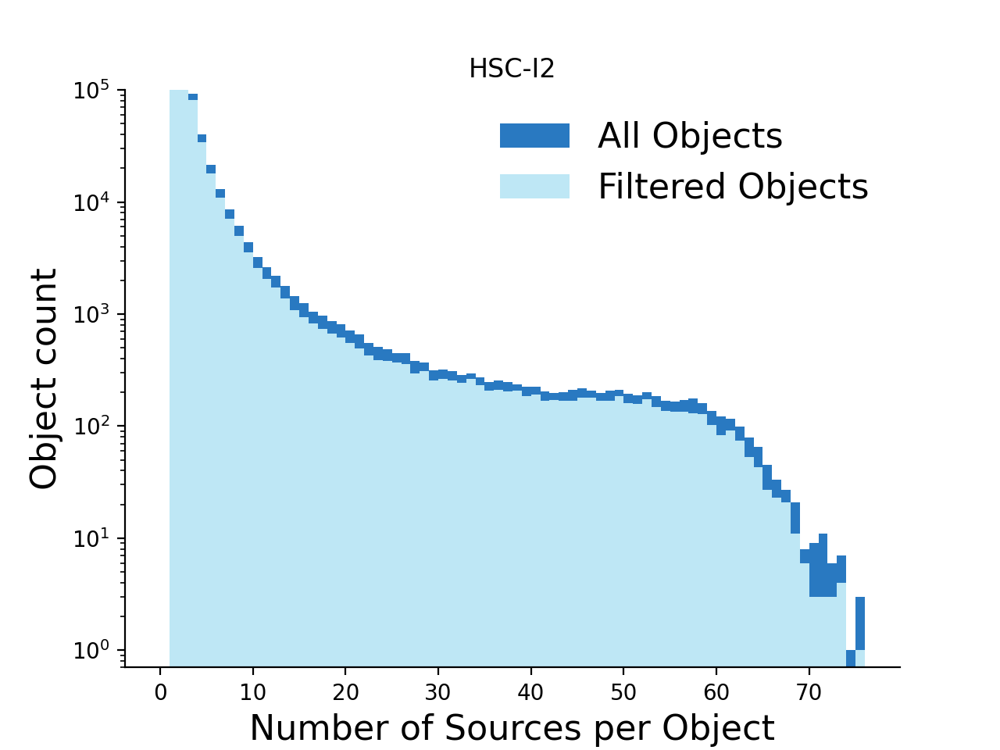

In [70]:
histI2 = doa.plotDiaObjectHistogram(objTableI2, goodObjI2, title='HSC-I2')

<IPython.core.display.Javascript object>


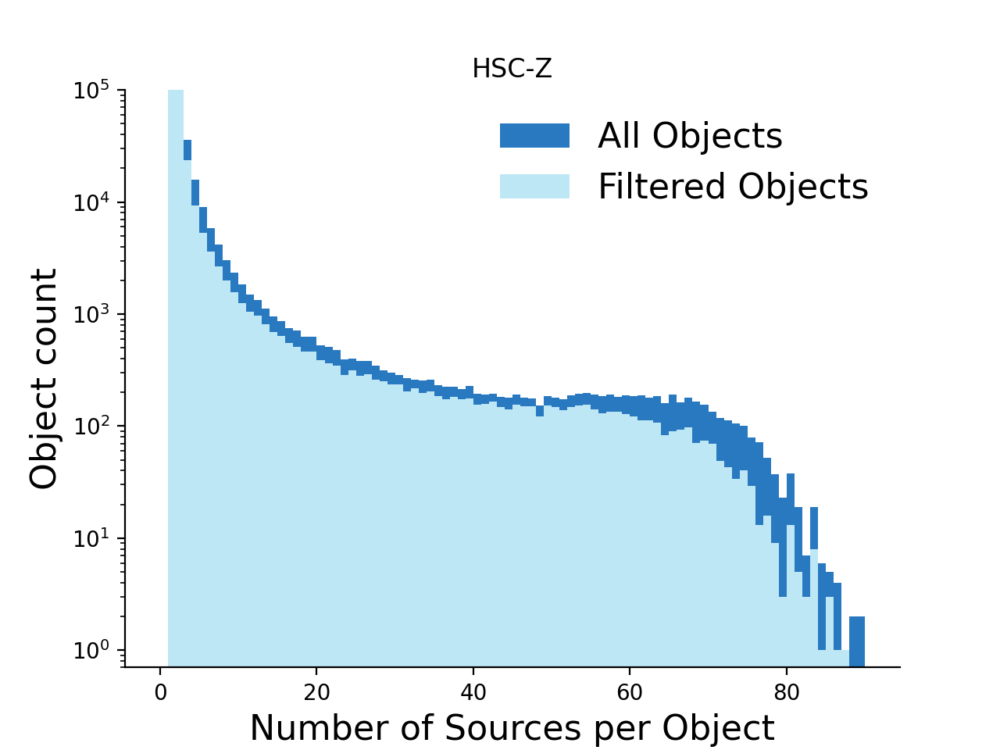

In [71]:
histZ = doa.plotDiaObjectHistogram(objTableZ, goodObjZ, title='HSC-Z')

<IPython.core.display.Javascript object>


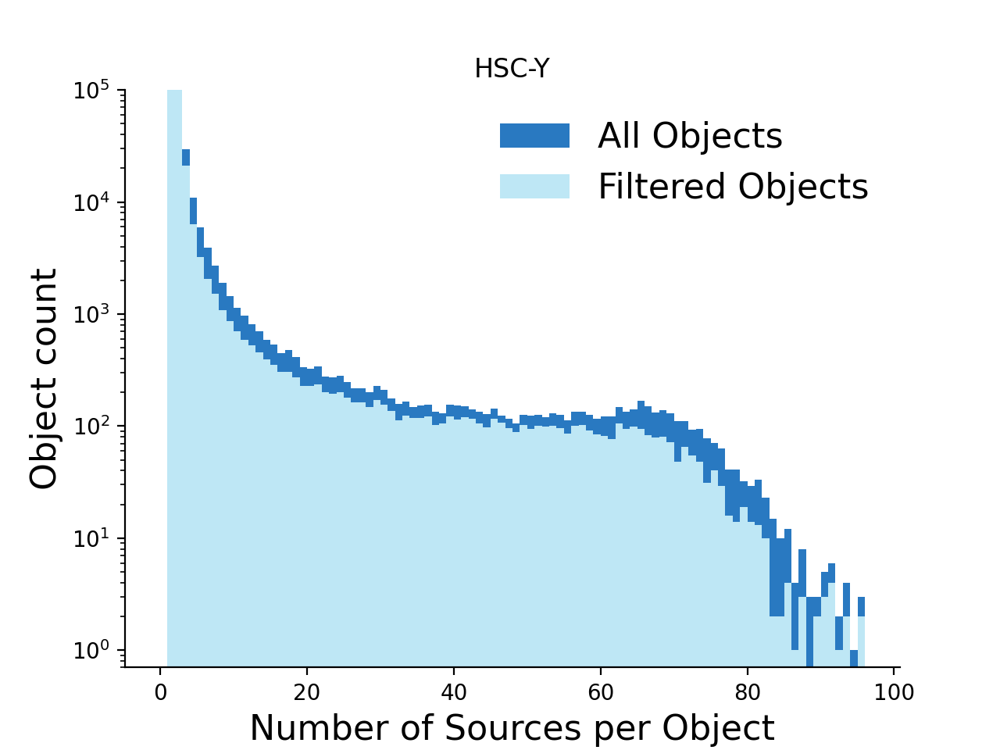

In [72]:
histY = doa.plotDiaObjectHistogram(objTableY, goodObjY, title='HSC-Y')

### Very quick look at how seeing varies with number of DIA Sources
An important caveat here! The utility to compute the area of a CCD and a visit is temporarily broken, so I've hardwired the visit area to 1.8 square degrees. *This is correct only when the visit is the full HSC focal plane*, which as can be seen above, is not always the case!

In [123]:
#ccdArea, visitArea = pla.getCcdAndVisitSizeOnSky(repoR2, goodSrcR2)  # broken
def seeingPlot(srcTable, filtername, visitArea=1.8):
    traceRadius = np.sqrt(0.5) * np.sqrt(srcTable.ixxPSF + srcTable.iyyPSF)
    srcTable['seeing'] = 2*np.sqrt(2*np.log(2)) * traceRadius
    visitGroup = srcTable.groupby('visit')

    night_count = srcTable.groupby(['date', 'visit']).count()
    visits_per_night = night_count.groupby('date').count()
    pervisit_per_night = night_count.groupby('date').mean()
    pervisit_per_night_std = night_count.groupby('date').std()
    pervisit_per_night_err = pervisit_per_night_std['x']/np.sqrt(visits_per_night['x'])

    plt.figure()
    plt.scatter(visitGroup.seeing.median().values, visitGroup.ccd.count().values/visitArea)
    plt.ylabel('Number of DIA Sources (per sq. deg.)')
    plt.xlabel('Median FWHM per ixx/iyy (pixels)')
    plt.title(filtername)

<IPython.core.display.Javascript object>


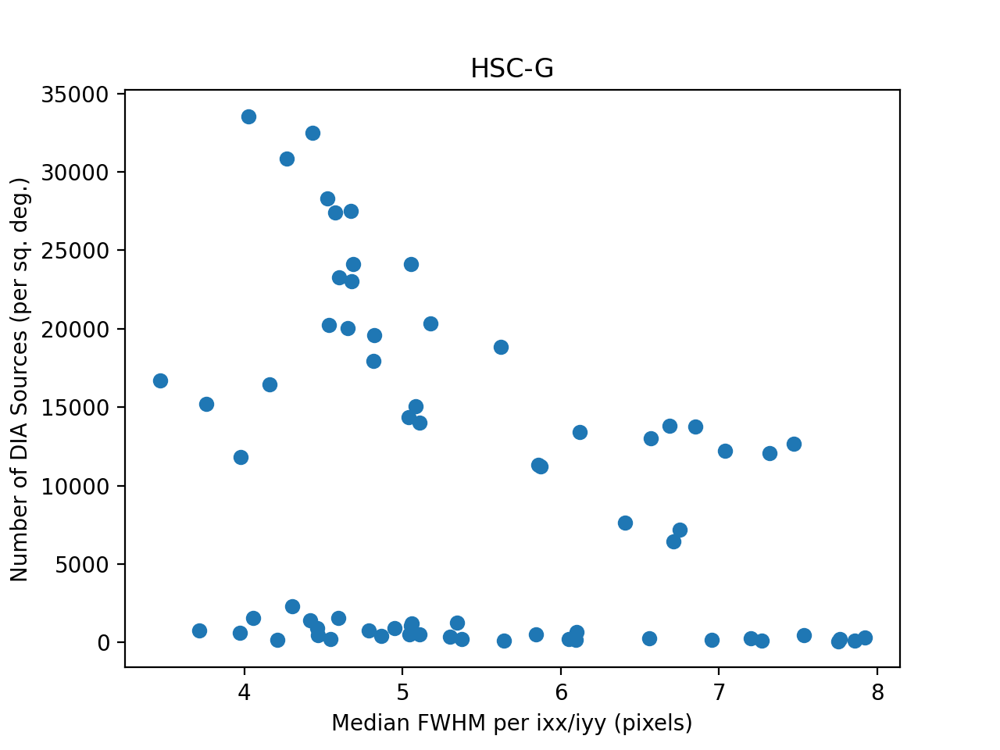

In [117]:
seeingPlot(goodSrcG, 'HSC-G')

<IPython.core.display.Javascript object>


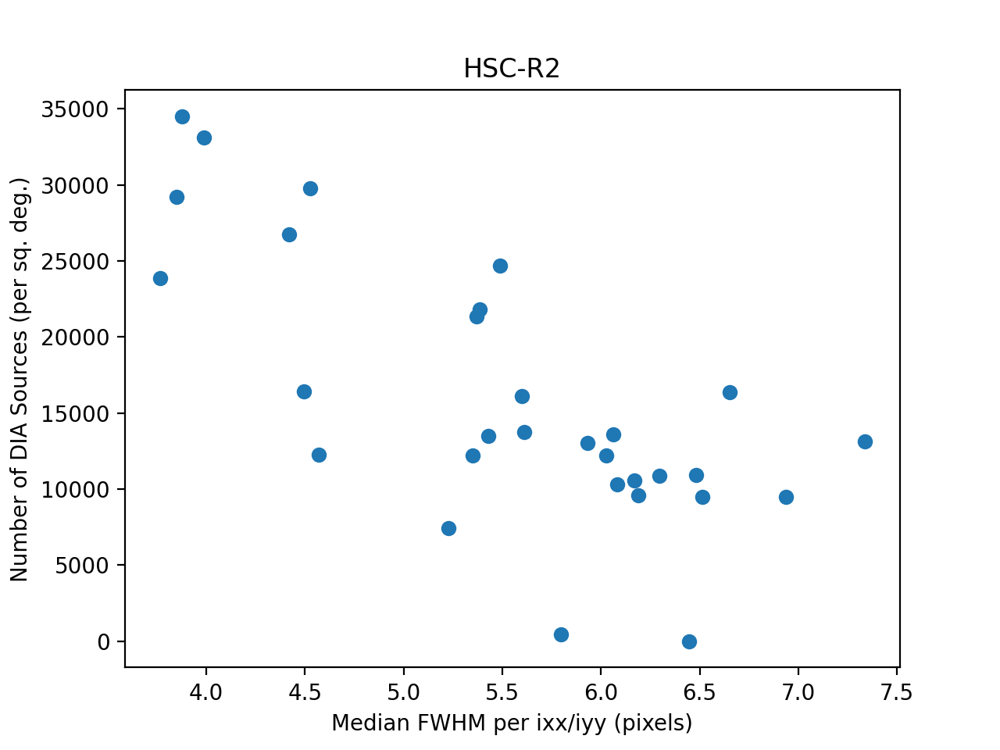

In [118]:
seeingPlot(goodSrcR2, 'HSC-R2')

<IPython.core.display.Javascript object>


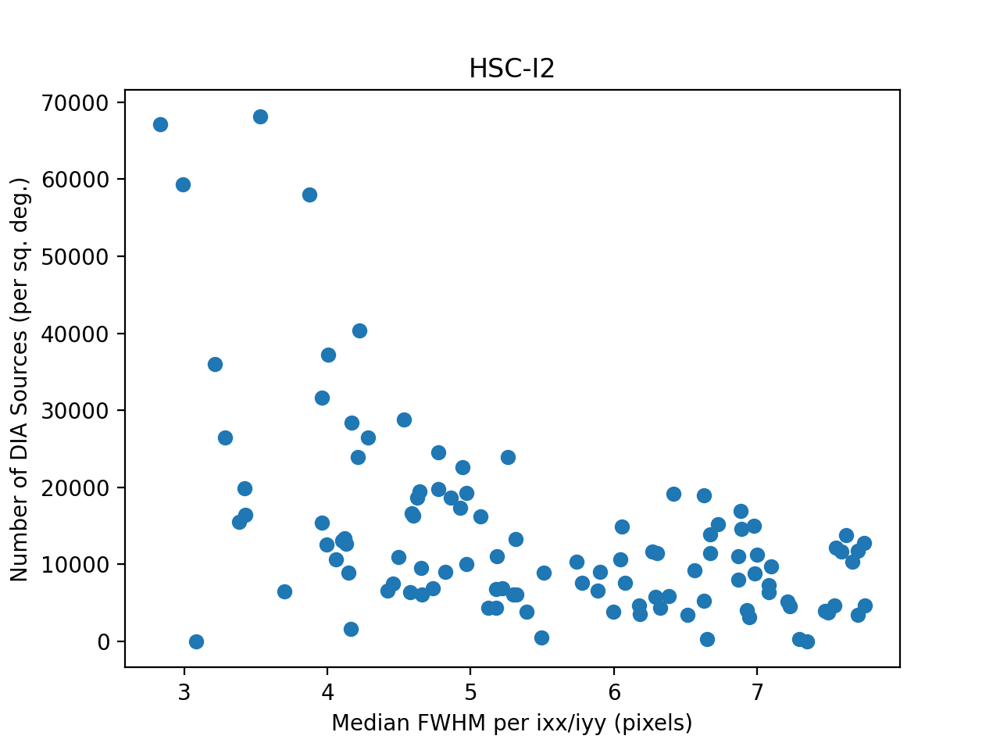

In [119]:
seeingPlot(goodSrcI2, 'HSC-I2')

<IPython.core.display.Javascript object>


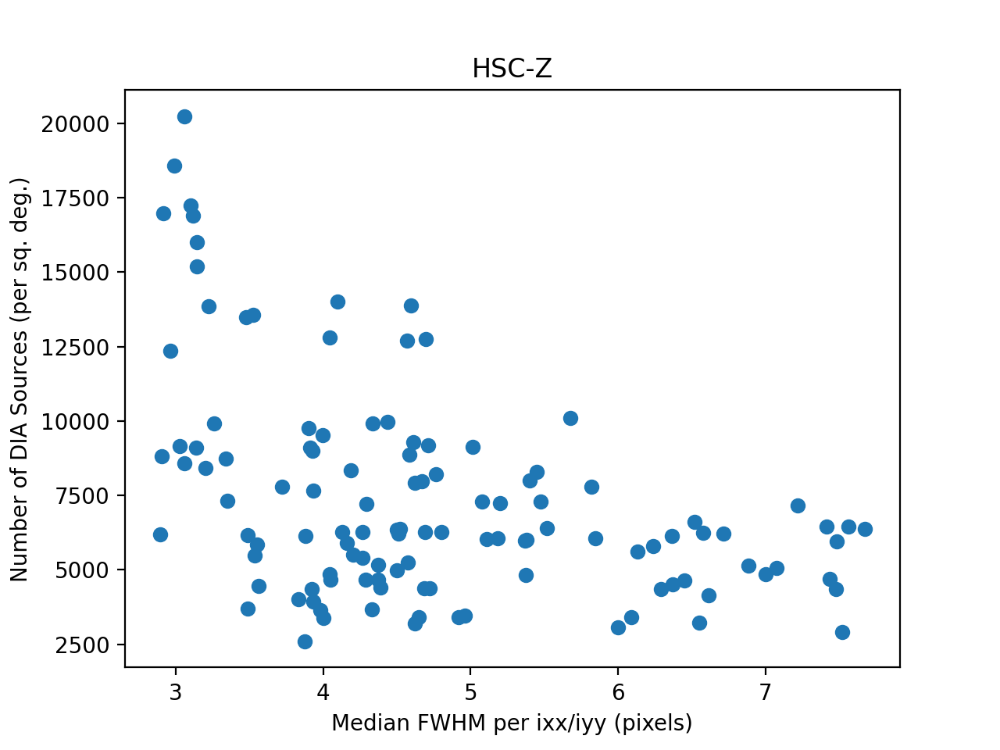

In [173]:
seeingPlot(goodSrcZ, 'HSC-Z')

<IPython.core.display.Javascript object>


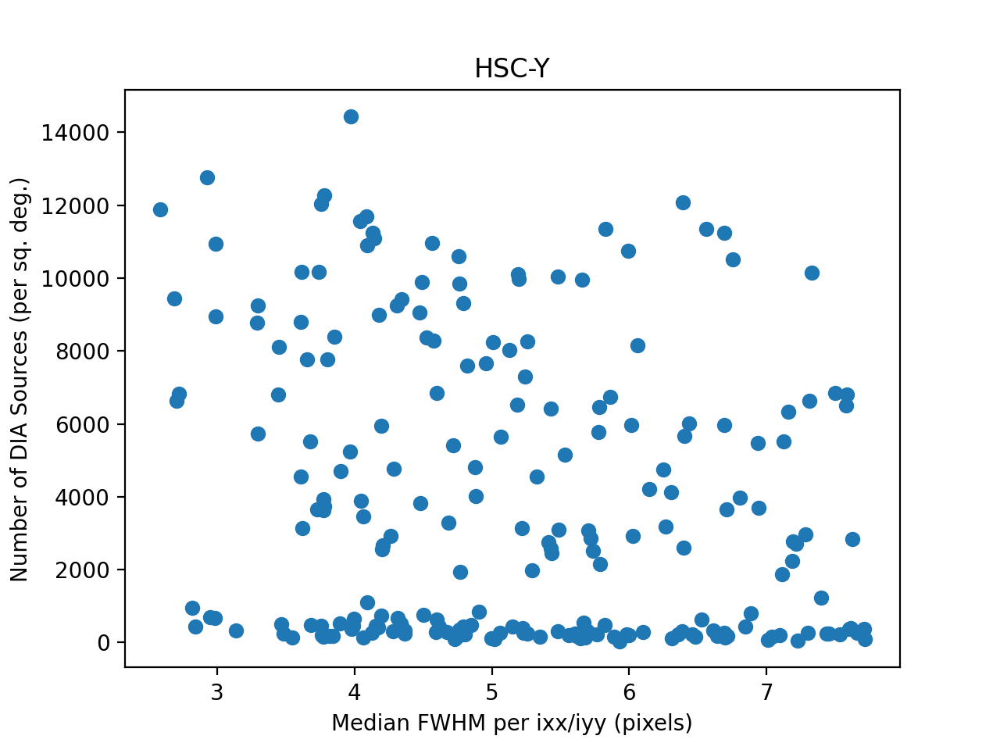

In [174]:
seeingPlot(goodSrcY, 'HSC-Y')

In [187]:
def plotFluxHistSrc(srcTable1, srcTable2=None, fluxType='psFlux', label1=None, label2=None, title=None, ylog=False):
    plt.figure(figsize=(7, 5))
    plt.xlabel(fluxType, size=12)
    plt.ylabel('DIA Source count', size=12)
    #bins = np.concatenate((-1*np.flip(np.logspace(-1, 6, 50)), np.logspace(-1, 6, 50)))
    bins = np.linspace(-4e3, 4e3, 200)
    if ylog:
        plt.yscale('log')
    #plt.xscale('symlog')
    plt.hist(srcTable1[fluxType].values, bins=bins, color='#2979C1', label=label1)
    if srcTable2 is not None:
        plt.hist(srcTable2[fluxType].values, bins=bins, color='#Bee7F5', label=label2)
    if label1:
        plt.legend(frameon=False, fontsize=12)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.title(title)

### Plot the distribution of PSF flux measurements on the difference images
There are positive and negative peaks because these are difference image fluxes

<IPython.core.display.Javascript object>


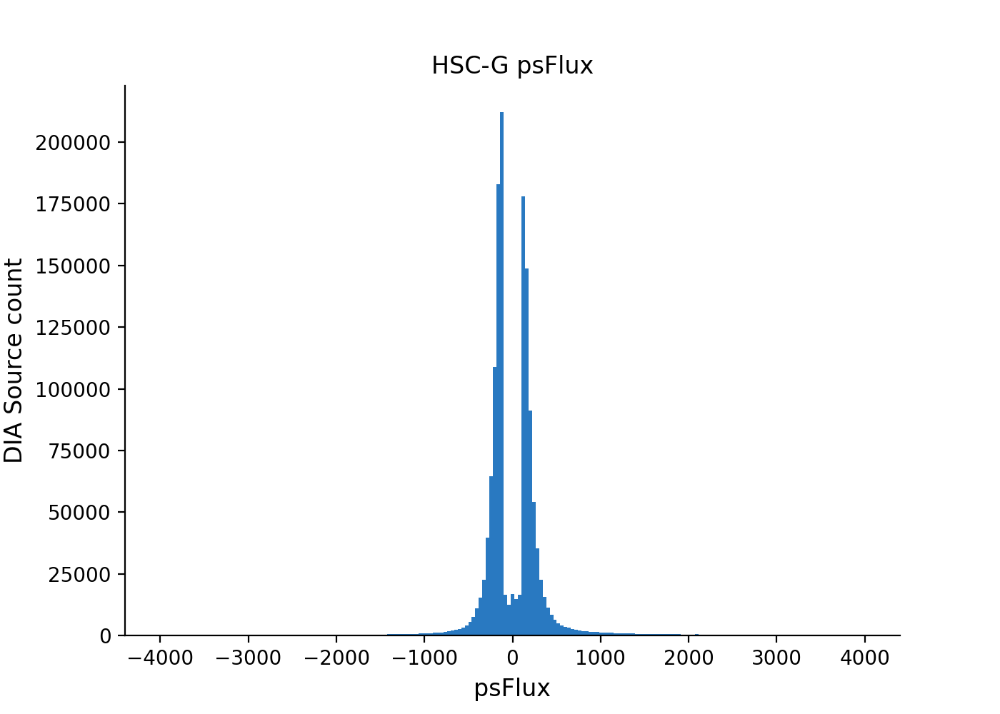

In [188]:
plotFluxHistSrc(srcTableG, fluxType='psFlux', title='HSC-G psFlux')

<IPython.core.display.Javascript object>


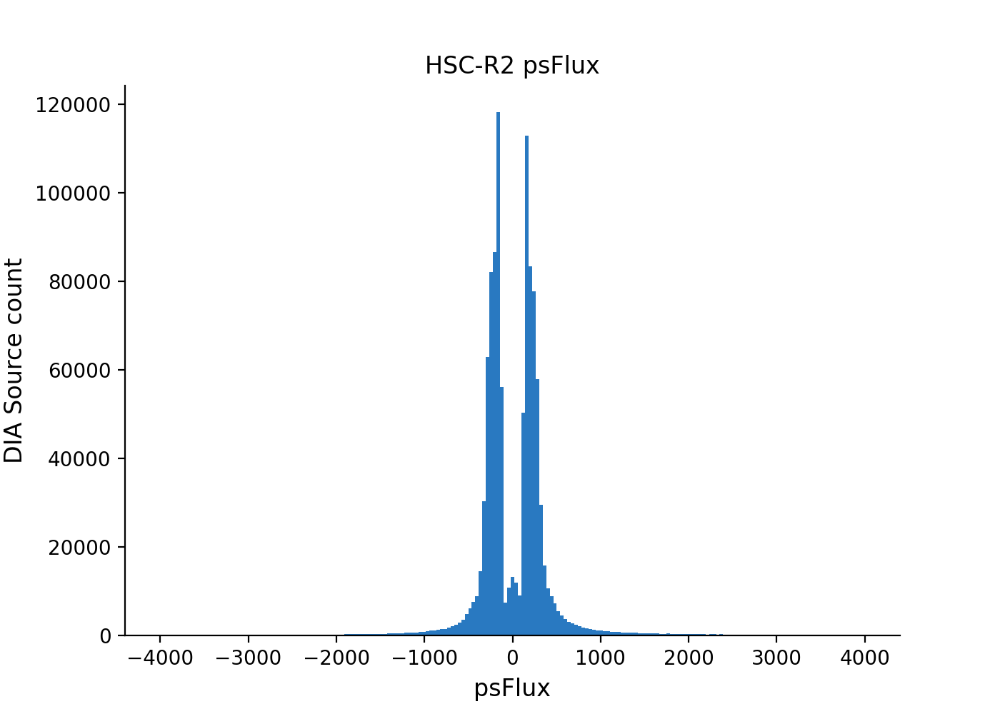

In [190]:
plotFluxHistSrc(srcTableR2, fluxType='psFlux', title='HSC-R2 psFlux')

<IPython.core.display.Javascript object>


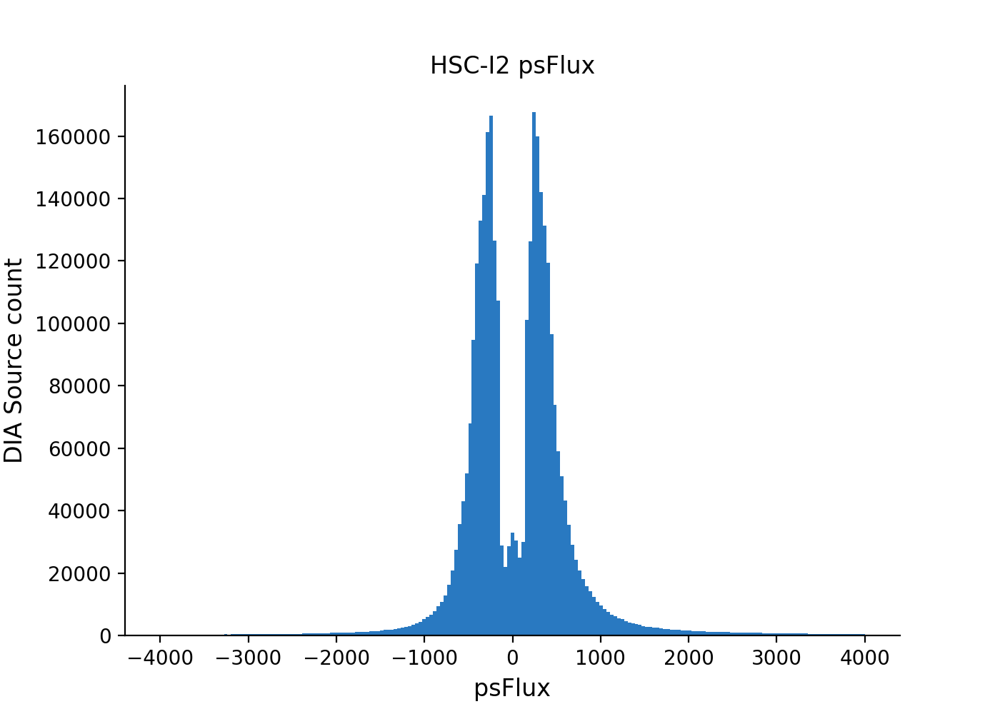

In [191]:
plotFluxHistSrc(srcTableI2, fluxType='psFlux', title='HSC-I2 psFlux')

<IPython.core.display.Javascript object>


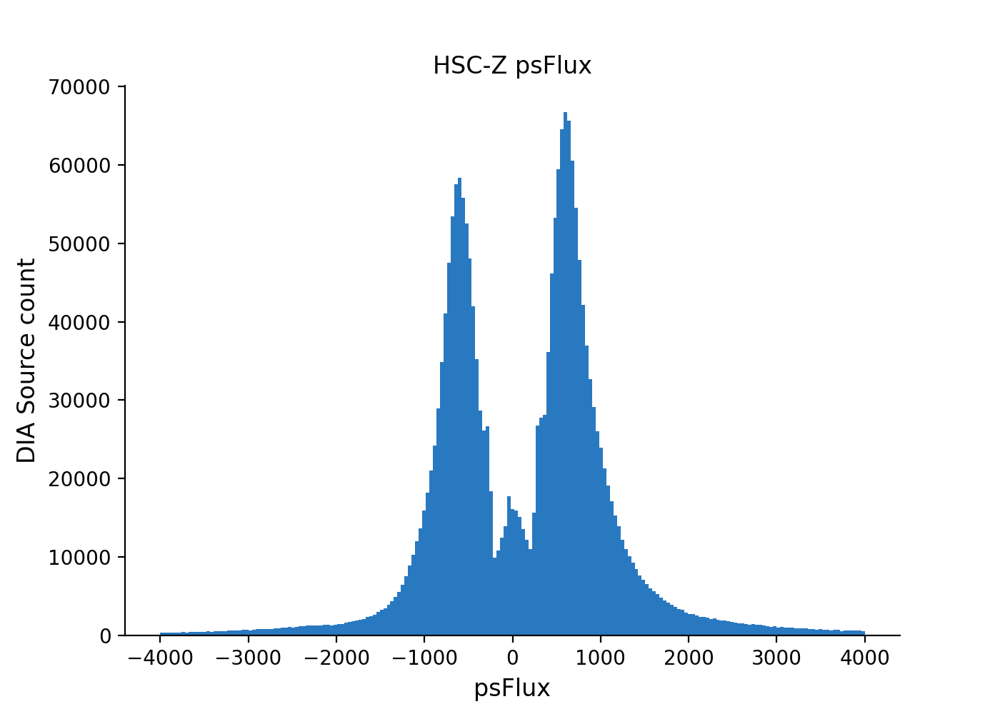

In [192]:
plotFluxHistSrc(srcTableZ, fluxType='psFlux', title='HSC-Z psFlux')

<IPython.core.display.Javascript object>


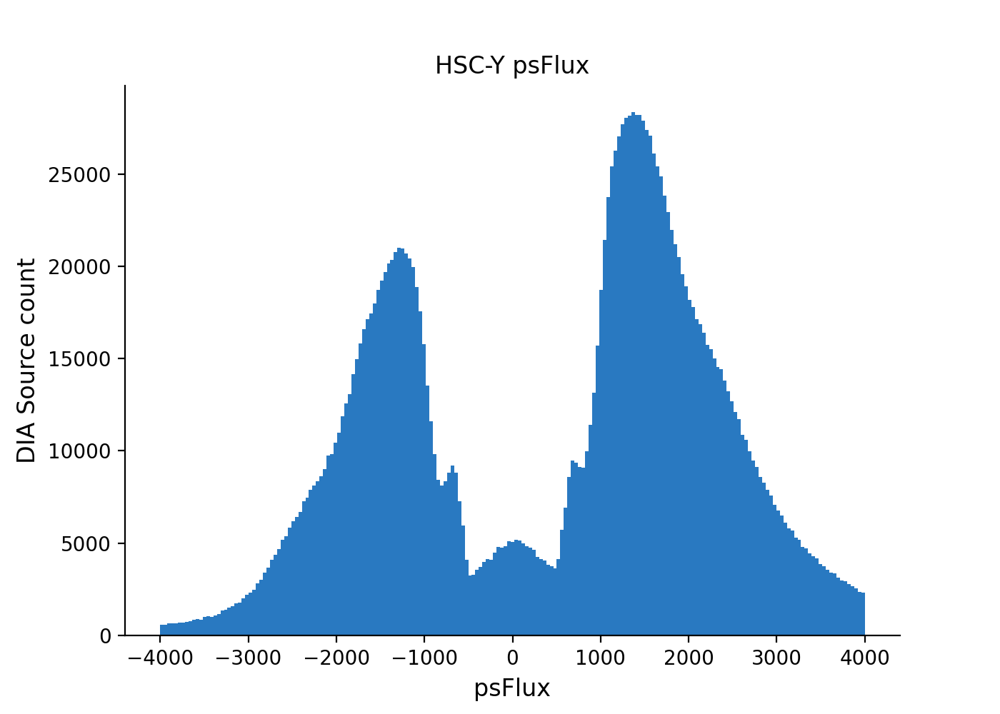

In [193]:
plotFluxHistSrc(srcTableY, fluxType='psFlux', title='HSC-Y psFlux')

In [154]:
def plot_flag_hist(flags, labels, title=None):
    assert len(flags) == len(labels)
    assert len(flags) == 29  # because we're doing custom slicing below

    fig, ax = plt.subplots(figsize=(9,9))

    pixelflags = ax.barh(labels[0:8], flags[0:8], color='C0')
    pixelcenterflags = ax.barh(labels[8:12], flags[8:12], color='C1')
    centroidflags = ax.barh(labels[12:15], flags[12:15], color='C4')
    apfluxflags = ax.barh(labels[15:17], flags[15:17], color='C5')
    psffluxflags = ax.barh(labels[17:20], flags[17:20], color='C2')
    ip_diffimflags = ax.barh(labels[20:23], flags[20:23], color='C5')
    shapeflags = ax.barh(labels[23::], flags[23::], color='C3')

    #ax.xaxis.set_tick_params(rotation=89)
    fig.subplots_adjust(left=0.35)
    ax.set_xlabel('Number of flagged DIASources')

    ax.legend((pixelflags[0],
               pixelcenterflags[0],
               centroidflags[0],
               apfluxflags[0], 
               psffluxflags[0],
               ip_diffimflags[0],
               shapeflags[0]), 
              ('Pixel flags', 
               'Pixel center flags',
               'Centroid flags',
               'ApFlux flags',
               'PsfFlux flags',
               'ip_diffim flags',
               'Shape flags'),
              frameon=False, loc='upper right', ncol=2
             )

    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.title(title)

<IPython.core.display.Javascript object>


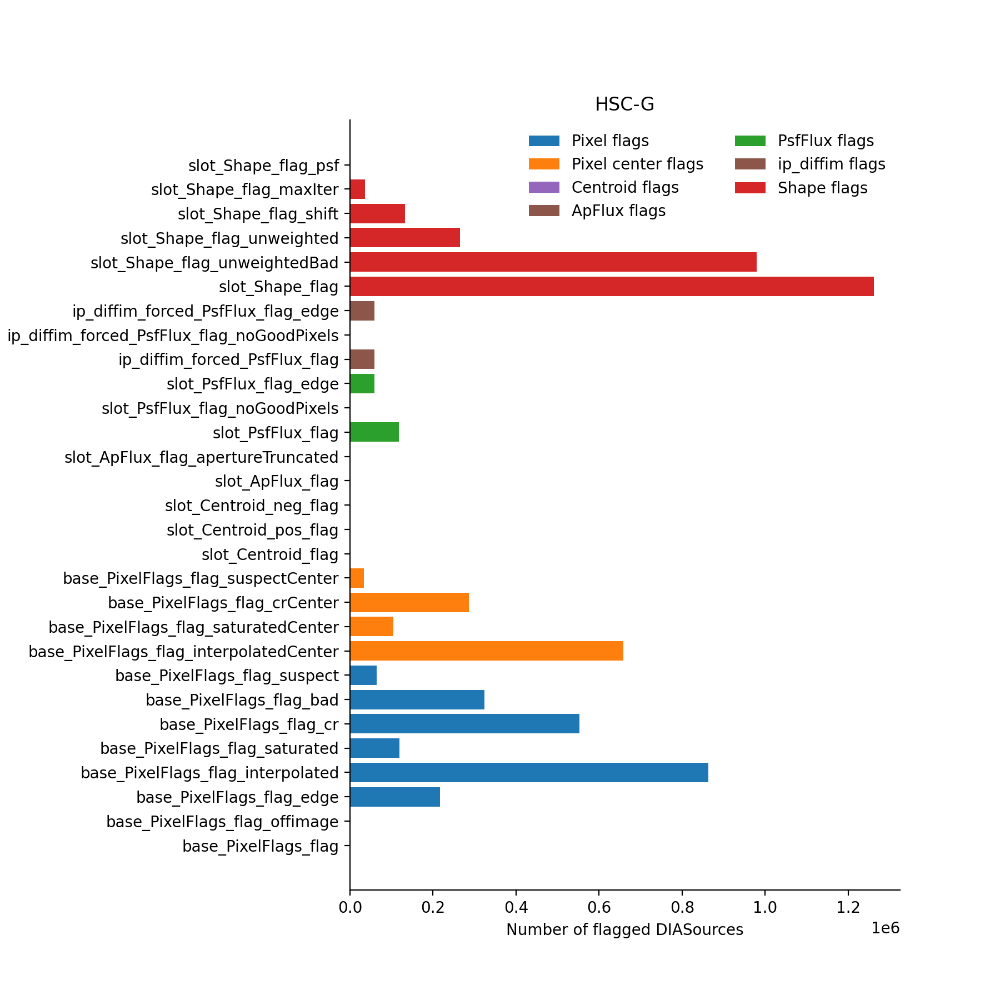

In [181]:
from lsst.ap.association import UnpackApdbFlags, MapDiaSourceConfig
config = MapDiaSourceConfig()
unpacker = UnpackApdbFlags(config.flagMap, 'DiaSource')
flag_valuesG = unpacker.unpack(srcTableG['flags'], 'flags')
flag_names = list(flag_valuesG.dtype.names)
flagTableG = pd.DataFrame(flag_valuesG, index=srcTableG.index)
flagSumG = flagTableG.sum()
plot_flag_hist([count for count in flagSumG.values], flag_names, title='HSC-G')

<IPython.core.display.Javascript object>


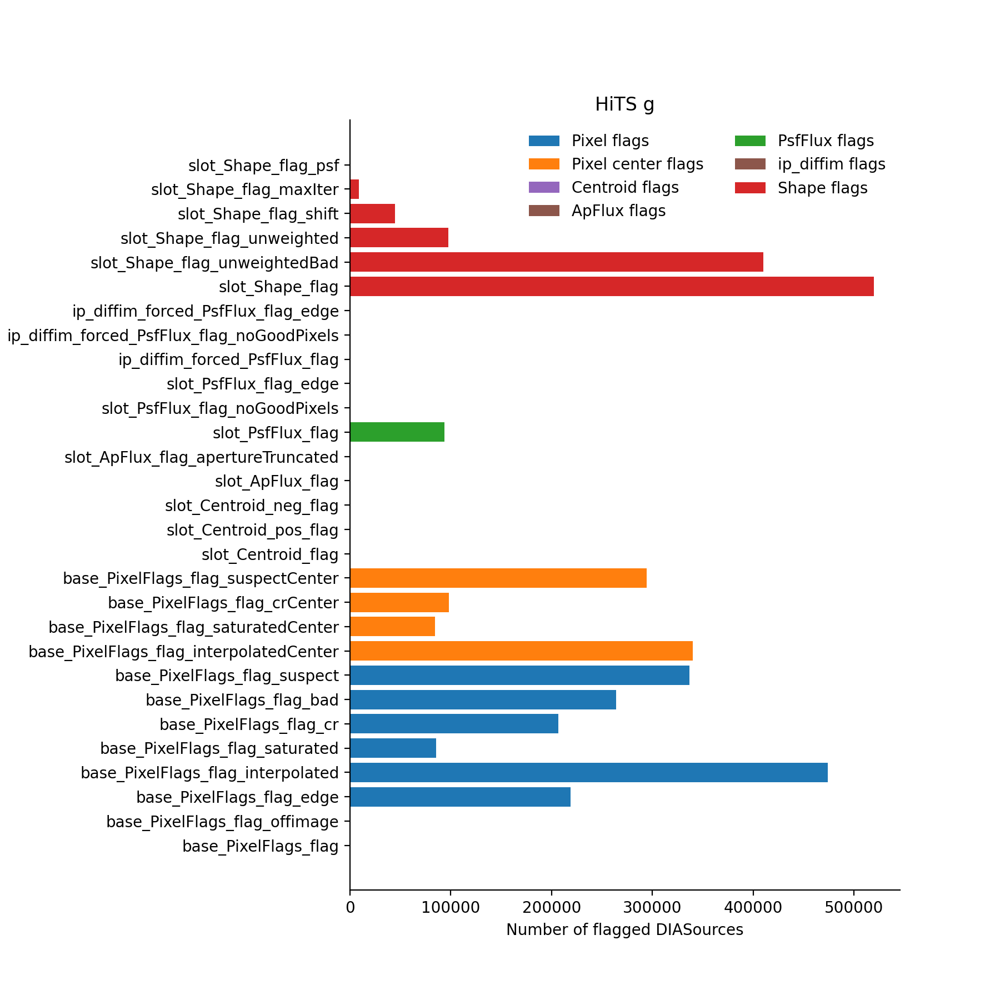

In [182]:
flag_valuesHits = unpacker.unpack(srcTableHits['flags'], 'flags')
flagTableHits = pd.DataFrame(flag_valuesHits, index=srcTableHits.index)
flagSumHits = flagTableHits.sum()
plot_flag_hist([count for count in flagSumHits.values], flag_names, title='HiTS g')

<IPython.core.display.Javascript object>


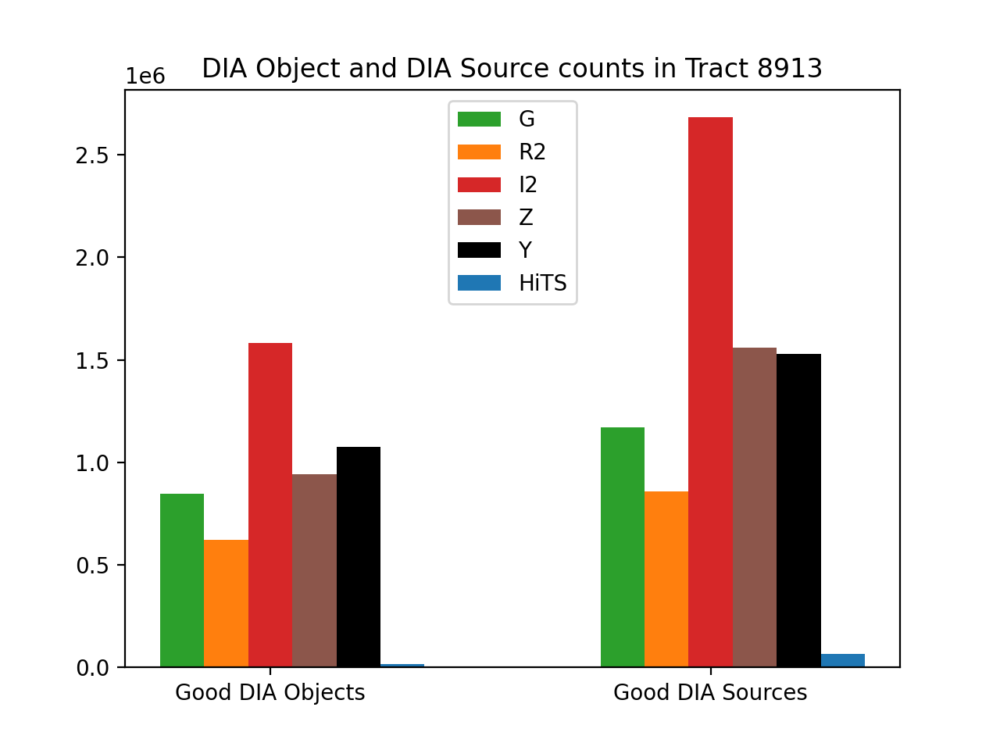

Text(0.5, 1.0, 'DIA Object and DIA Source counts in Tract 8913')

In [204]:
fig, ax = plt.subplots()
barLabels = ['Good DIA Objects', 'Good DIA Sources']
xbar = np.array([0, 1])
width = 0.2

hitsObjCompare = (goodObjHits['decl'] > 0)
hitsSrcCompare = (goodSrcHits['decl'] > 0)

ax.bar(xbar - width, [len(goodObjG), len(goodSrcG)], width/2, label='G', color='C2')
ax.bar(xbar - width/2, [len(goodObjR2), len(goodSrcR2)], width/2, label='R2', color='C1')
ax.bar(xbar, [len(goodObjI2), len(goodSrcI2)], width/2, label='I2', color='C3')
ax.bar(xbar + width/2, [len(goodObjZ), len(goodSrcZ)], width/2, label='Z', color='C5')
ax.bar(xbar + width, [len(goodObjY), len(goodSrcY)], width/2, label='Y', color='k')
ax.bar(xbar + width + width/2, [len(goodObjHits[hitsObjCompare]), len(goodSrcHits[hitsSrcCompare])],
       width/2, label='HiTS', color='C0')

plt.legend(loc='upper center')
ax.set_xticks([0, 1])
labels = ax.set_xticklabels(barLabels)
plt.title('DIA Object and DIA Source counts in Tract 8913')

As before, "good" here doesn't mean that I think all the DIA Sources plotted are physically real! Instead it means they don't have any of the bad, suspect, or saturatedCenter flags. It's more illustrative to compare them to a "reasonable" number of g-band DIA sources as detected by DECam in the same field, which is the tiny blue bar. It's worth noting the HSC exposure times are all ~300 s whereas the DECam exposure times for HiTS 2015 are all 87 s. While more DIA Sources are expected for HSC, it should not be nearly this many more.